<a href="https://colab.research.google.com/github/konrado10/NaukaGIT/blob/master/Zad130.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Redykcja Wymiarowości

## t-SNE

### Zad 15

In [1]:
import pandas as pd
import numpy as np
from keras.datasets import mnist
import plotly.graph_objects as go
import plotly.express as px
import matplotlib.pyplot as plt

np.random.seed(42)

In [2]:
(X_train, y_train), (X_test, y_test) = mnist.load_data()

print(f'X_train shape: {X_train.shape}')
print(f'X_test shape: {X_test.shape}')
print(f'y_train shape: {y_train.shape}')
print(f'y_test shape: {y_test.shape}')

11493376/11490434 [==============================] - 0s 0us/step
X_train shape: (60000, 28, 28)
X_test shape: (10000, 28, 28)
y_train shape: (60000,)
y_test shape: (10000,)


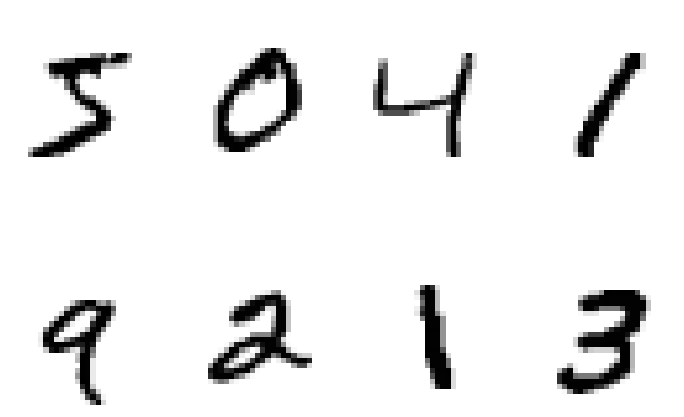

In [3]:
plt.figure(figsize=(12, 8))
for i in range(8):
    plt.subplot(240 + i + 1)
    plt.imshow(X_train[i], cmap='gray_r')
    plt.title(y_train[i], color='white', fontsize=17)
    plt.axis('off')
plt.show()

In [4]:
X_train = X_train[:10000].reshape(-1,28*28)
y_train = y_train[:10000]
X_train.shape

(10000, 784)

In [6]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train_std = scaler.fit_transform(X_train)

In [7]:
from sklearn.decomposition import PCA

pca = PCA(n_components=3)
X_train_pca = pca.fit_transform(X_train_std)
X_train_pca.shape

(10000, 3)

In [8]:
results = pd.DataFrame(data = {'explained_variance_ratio': pca.explained_variance_ratio_})
results['cumulative'] = results.explained_variance_ratio.cumsum()
results['component'] = results.index + 1
results

,explained_variance_ratio,cumulative,component
0,0.061640,0.061640,1
1,0.043662,0.105302,2
2,0.040458,0.145760,3


In [9]:
fig = go.Figure(data = [go.Bar(x=results.component, y=results.explained_variance_ratio, name = 'explained_variance_ratio'),
                        go.Scatter(x=results.component, y=results.cumulative, name = 'cumulative')],
                layout = go.Layout(title='PCA - 3 components', width = 1000, template = 'plotly_dark'))
fig.show()

In [13]:
X_train_pca_df = pd.DataFrame(data = np.c_[X_train_pca, y_train], columns = ['pca_1', 'pca_2', 'pca_3', 'class'])
X_train_pca_df['class'] = X_train_pca_df['class'].astype(str)
X_train_pca_df.head()

,pca_1,pca_2,pca_3,class
0,-0.997652,-4.652699,-0.740638,5.0
1,8.682758,-7.123700,-4.194685,0.0
2,2.439059,10.567253,-4.058946,4.0
3,-7.291486,-3.686136,3.065267,1.0
4,-4.791478,4.498237,-5.603298,9.0


In [14]:
px.scatter(X_train_pca_df, x = 'pca_1', y = 'pca_2', color = 'class', opacity=0.5, width = 950, title = 'PCA -  2 componets', template='plotly_dark')

In [16]:
px.scatter_3d(X_train_pca_df, x = 'pca_1', y = 'pca_2', z = 'pca_3', color = 'class', opacity=0.5, width = 1000, height=700, title = 'PCA - 3 componets', template='plotly_dark')

In [17]:
from sklearn.manifold import TSNE

tsne = TSNE(n_components = 2, verbose = 1)
X_train_tsne = tsne.fit_transform(X_train_std)


[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 10000 samples in 1.052s...
[t-SNE] Computed neighbors for 10000 samples in 180.723s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 5.161201
[t-SNE] KL divergence after 250 iterations with early exaggeration: 88.463593
[t-SNE] KL divergence after 1000 iterations: 1.717055


In [18]:
X_train_tsne_df = pd.DataFrame(data = np.c_[X_train_tsne, y_train], columns = ['tsne_1', 'tsne_2', 'class'])
X_train_tsne_df['class'] = X_train_tsne_df['class'].astype(str)
X_train_tsne_df

,tsne_1,tsne_2,class
0,12.473772,-33.515553,5.0
1,68.135033,17.868418,0.0
2,-4.705827,67.267838,4.0
3,-50.587410,-34.830677,1.0
4,-50.632835,51.756950,9.0
...,...,...,...
9995,6.150591,-58.521179,5.0
9996,7.073588,1.352484,8.0
9997,53.151417,-32.478165,6.0
9998,-37.292786,38.642384,9.0


In [20]:
px.scatter(X_train_tsne_df, x = 'tsne_1', y = 'tsne_2', color = 'class', opacity=0.5, width = 950, height = 700, title = 'TSNE -  2 componets', template='plotly_dark')

In [23]:
from plotly.subplots import make_subplots

fig = make_subplots(rows=1, cols=2, subplot_titles = ['PCA', 't_SNE'], horizontal_spacing=0.03)

fig1 = px.scatter(X_train_pca_df, x = 'pca_1', y='pca_2', color = 'class', opacity = 0.5)
fig2 = px.scatter(X_train_tsne_df, x = 'tsne_1', y='tsne_2', color = 'class', opacity = 0.5)

for i in range(0,10):
    fig.add_trace(fig1['data'][i], row = 1, col=1)
    fig.add_trace(fig2['data'][i], row = 1, col = 2)
fig.update_layout(width=950, showlegend=False, template='plotly_dark')

In [25]:
pca = PCA(n_components=50)
X_train_pca = pca.fit_transform(X_train_std)
X_train_pca.shape

(10000, 50)

In [26]:
tsne = TSNE(n_components=2, verbose = 1)
X_train_tsne_50 = tsne.fit_transform(X_train_pca)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.066s...
[t-SNE] Computed neighbors for 10000 samples in 14.828s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 3.745719
[t-SNE] KL divergence after 250 iterations with early exaggeration: 85.369980
[t-SNE] KL divergence after 1000 iterations: 1.651953


In [27]:
X_train_tsne_50_df = pd.DataFrame(data = np.c_[X_train_tsne_50, y_train], columns = ['tsne_1', 'tsne_2', 'class'])
X_train_tsne_50_df['class'] = X_train_tsne_50_df['class'].astype(str)
X_train_tsne_50_df

,tsne_1,tsne_2,class
0,35.985558,18.815577,5.0
1,6.941176,78.782066,0.0
2,-43.805382,20.289879,4.0
3,-4.349764,-79.495018,1.0
4,-57.180016,-12.975603,9.0
...,...,...,...
9995,57.355835,-1.415797,5.0
9996,0.678481,-10.496089,8.0
9997,64.333412,21.192741,6.0
9998,-53.460346,-15.561502,9.0


In [28]:
px.scatter(X_train_tsne_50_df, x = 'tsne_1', y = 'tsne_2', color = 'class', opacity=0.5, width = 950, height = 700, title = 't-SNE -  2 componets after PCA', template='plotly_dark')

In [30]:
from plotly.subplots import make_subplots

fig = make_subplots(rows=1, cols=3, subplot_titles = ['PCA', 't-SNE', 't-SNE after PCA'], horizontal_spacing=0.03)

fig1 = px.scatter(X_train_pca_df, x = 'pca_1', y='pca_2', color = 'class', opacity = 0.5)
fig2 = px.scatter(X_train_tsne_df, x = 'tsne_1', y='tsne_2', color = 'class', opacity = 0.5)
fig3 = px.scatter(X_train_tsne_50_df, x = 'tsne_1', y='tsne_2', color = 'class', opacity = 0.5)

for i in range(0,10):
    fig.add_trace(fig1['data'][i], row = 1, col = 1)
    fig.add_trace(fig2['data'][i], row = 1, col = 2)
    fig.add_trace(fig3['data'][i], row = 1, col = 3)
fig.update_layout(width=1200, showlegend=False, template='plotly_dark')
fig.show()

In [31]:
tsne = TSNE(n_components=3, verbose = 1)
X_train_tsne = tsne.fit_transform(X_train_pca)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.066s...
[t-SNE] Computed neighbors for 10000 samples in 13.747s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 3.745719
[t-SNE] KL divergence after 250 iterations with early exaggeration: 85.449646
[t-SNE] KL divergence after 1000 iterations: 1.453648


In [33]:
X_train_tsne_df = pd.DataFrame(data = np.c_[X_train_tsne, y_train], columns = ['tsne_1', 'tsne_2','tsne_3', 'class'])
X_train_tsne_df['class'] = X_train_tsne_df['class'].astype(str)
X_train_tsne_df

,tsne_1,tsne_2,tsne_3,class
0,-7.249687,13.325682,2.836154,5.0
1,-4.740350,14.586839,-16.584131,0.0
2,21.165163,-1.983230,-2.931379,4.0
3,-10.846617,1.473881,15.189384,1.0
4,11.502681,-10.183220,8.579481,9.0
...,...,...,...,...
9995,6.526671,17.466431,-3.333740,5.0
9996,7.258500,3.066478,0.610006,8.0
9997,10.590039,-8.545794,-15.778984,6.0
9998,10.223157,-7.575271,8.567950,9.0


In [34]:
px.scatter_3d(X_train_tsne_df, x = 'tsne_1', y = 'tsne_2', z = 'tsne_3', color = 'class', opacity = 0.5, width = 1000, height = 700, title = 'TSNE - 3 components', template = 'plotly_dark')

In [35]:
TSNE?

# Reguły Asocjacyjne, Apriori

### Zad 16

In [40]:
import pandas as pd
import numpy as np

In [37]:
data = {'produkty': ['chleb jajka mleko', 'mleko ser', 'chleb masło ser', 'chleb jajka']}

transactions = pd.DataFrame(data=data, index=[1, 2, 3, 4])
transactions

,produkty
1,chleb jajka mleko
2,mleko ser
3,chleb masło ser
4,chleb jajka


In [41]:
expand = transactions.produkty.str.split(' ', expand = True)
expand

,0,1,2
1,chleb,jajka,mleko
2,mleko,ser,None
3,chleb,masło,ser
4,chleb,jajka,None


In [43]:
products = []
for col in expand.columns:
    for product in expand[col].unique():
        if product is not None and product not in products:
            products.append(product)
products.sort()
print(products)

['chleb', 'jajka', 'masło', 'mleko', 'ser']


In [44]:
transactions_encoded = np.zeros((len(transactions), len(products)), dtype = 'int8')
transactions_encoded

array([[0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0]], dtype=int8)

In [47]:
for row in zip(range(len(transactions)), transactions_encoded, expand.values):
    for idx, product in enumerate(products):
        if product in row[2]:
            transactions_encoded[row[0], idx] = 1

transactions_encoded

array([[1, 1, 0, 1, 0],
       [0, 0, 0, 1, 1],
       [1, 0, 1, 0, 1],
       [1, 1, 0, 0, 0]], dtype=int8)

In [48]:
transactions_encoded_df = pd.DataFrame(transactions_encoded, columns = products)
transactions_encoded_df

,chleb,jajka,masło,mleko,ser
0,1,1,0,1,0
1,0,0,0,1,1
2,1,0,1,0,1
3,1,1,0,0,0


Algorytm Apriori

In [49]:
from mlxtend.frequent_patterns import apriori, association_rules

supports = apriori(transactions_encoded_df, min_support = 0.0, use_colnames = True)
supports

,support,itemsets
0,0.75,(chleb)
1,0.50,(jajka)
2,0.25,(masło)
3,0.50,(mleko)
4,0.50,(ser)
5,0.50,"(chleb, jajka)"
6,0.25,"(chleb, masło)"
7,0.25,"(mleko, chleb)"
8,0.25,"(chleb, ser)"
9,0.00,"(jajka, masło)"


In [50]:
supports = apriori(transactions_encoded_df, min_support = 0.3, use_colnames = True)
supports

,support,itemsets
0,0.75,(chleb)
1,0.50,(jajka)
2,0.50,(mleko)
3,0.50,(ser)
4,0.50,"(chleb, jajka)"


In [51]:
rules = association_rules(supports, metric = 'confidence', min_threshold=0.65)
rules = rules.iloc[:, [0,1,4,5,6]]
rules

,antecedents,consequents,support,confidence,lift
0,(chleb),(jajka),0.5,0.666667,1.333333
1,(jajka),(chleb),0.5,1.000000,1.333333


In [52]:
rules.sort_values(by = 'lift', ascending=False)

,antecedents,consequents,support,confidence,lift
0,(chleb),(jajka),0.5,0.666667,1.333333
1,(jajka),(chleb),0.5,1.000000,1.333333


### Zad 17

In [1]:
import pandas as pd

pd.set_option('display.float_format', lambda x: f'{x:.2f}')

In [2]:
!wget https://storage.googleapis.com/esmartdata-courses-files/ml-course/products.csv
!wget https://storage.googleapis.com/esmartdata-courses-files/ml-course/orders.csv

--2020-12-25 20:24:47--  https://storage.googleapis.com/esmartdata-courses-files/ml-course/products.csv
Resolving storage.googleapis.com (storage.googleapis.com)... 108.177.112.128, 172.217.212.128, 172.217.214.128, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|108.177.112.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2166953 (2.1M) [application/octet-stream]
Saving to: ‘products.csv.2’

products.csv.2      100%[===================>]   2.07M  --.-KB/s    in 0.02s   

2020-12-25 20:24:47 (103 MB/s) - ‘products.csv.2’ saved [2166953/2166953]

--2020-12-25 20:24:47--  https://storage.googleapis.com/esmartdata-courses-files/ml-course/orders.csv
Resolving storage.googleapis.com (storage.googleapis.com)... 142.250.125.128, 172.217.212.128, 172.217.214.128, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|142.250.125.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 24680147 (24M) [application/oct

In [3]:
products = pd.read_csv('products.csv', usecols=['product_id', 'product_name'])
products.head()

,product_id,product_name
0,1,Chocolate Sandwich Cookies
1,2,All-Seasons Salt
2,3,Robust Golden Unsweetened Oolong Tea
3,4,Smart Ones Classic Favorites Mini Rigatoni Wit...
4,5,Green Chile Anytime Sauce


In [4]:
orders = pd.read_csv('orders.csv', usecols=['order_id', 'product_id'])
orders.head()

,order_id,product_id
0,1,49302
1,1,11109
2,1,10246
3,1,49683
4,1,43633


In [5]:
data = pd.merge(orders, products, how = 'inner', on = 'product_id', sort = True)
data = data.sort_values(by = 'order_id')
data.head()

,order_id,product_id,product_name
588447,1,22035,Organic Whole String Cheese
256931,1,10246,Organic Celery Hearts
277441,1,11109,Organic 4% Milk Fat Whole Milk Cottage Cheese
1194893,1,43633,Lightly Smoked Sardines in Olive Oil
1302365,1,47209,Organic Hass Avocado


In [6]:
data.describe()

,order_id,product_id
count,1384617.00,1384617.00
mean,1706297.62,25556.24
std,989732.65,14121.27
min,1.00,1.00
25%,843370.00,13380.00
50%,1701880.00,25298.00
75%,2568023.00,37940.00
max,3421070.00,49688.00


In [7]:
data.product_name.value_counts()

Banana                                    18726
Bag of Organic Bananas                    15480
Organic Strawberries                      10894
Organic Baby Spinach                       9784
Large Lemon                                8135
                                          ...  
Chardonnay Paso Robles                        1
Frozen Mexican Style Pulled Pork Bowl         1
Organic Medium Yellow Thai Curry              1
Nerds Grape and Strawberry Sugar Candy        1
Raw Vegan Bombay Ranch Kale Chips             1
Name: product_name, Length: 39123, dtype: int64

In [8]:
data.order_id.nunique()

131209

In [9]:
transactions = data.groupby(by = 'order_id')['product_name'].apply(lambda name: ','.join(name))
transactions

order_id
1          Organic Whole String Cheese,Organic Celery Hea...
36         Super Greens Salad,Spring Water,Organic Garnet...
38         Green Peas,Organic Baby Arugula,Shelled Pistac...
96         Organic Raspberries,Organic Pomegranate Kernel...
98         Uncured Applewood Smoked Bacon,Black Beans,Org...
                                 ...                        
3421049    Gluten Free Rice Bread,Organic Baby Broccoli,O...
3421056    Sparkling Lemon Water,Brioche Buns,Homestyle C...
3421058    Classic Britannia Crisps,Club Soda Lower Sodiu...
3421063    Natural Artesian Water,Organic Half & Half,Twi...
3421070    Broccoli Florettes,Organic Unsweetened Almond ...
Name: product_name, Length: 131209, dtype: object

In [10]:
transactions = transactions.str.split(',')
transactions

order_id
1          [Organic Whole String Cheese, Organic Celery H...
36         [Super Greens Salad, Spring Water, Organic Gar...
38         [Green Peas, Organic Baby Arugula, Shelled Pis...
96         [Organic Raspberries, Organic Pomegranate Kern...
98         [Uncured Applewood Smoked Bacon, Black Beans, ...
                                 ...                        
3421049    [Gluten Free Rice Bread, Organic Baby Broccoli...
3421056    [Sparkling Lemon Water, Brioche Buns, Homestyl...
3421058    [Classic Britannia Crisps, Club Soda Lower Sod...
3421063    [Natural Artesian Water, Organic Half & Half, ...
3421070    [Broccoli Florettes, Organic Unsweetened Almon...
Name: product_name, Length: 131209, dtype: object

Kodowanie transakcji

In [11]:
from mlxtend.preprocessing import TransactionEncoder

encoder = TransactionEncoder()
encoder.fit(transactions)
transactions_encoded = encoder.transform(transactions, sparse = True)
transactions_encoded

<131209x40434 sparse matrix of type '<class 'numpy.bool_'>'
	with 1442410 stored elements in Compressed Sparse Row format>

In [12]:
transactions_encoded_df = pd.DataFrame(transactions_encoded.toarray(), columns=encoder.columns_)
transactions_encoded_df

,,Apricot & Banana Stage 2 Baby Food,Broad Spectrum SPF 30,Instant,Livermore Valley,Low Sodium Marinara,Premium,Vetiver scent,Whole,#2,& Baby Wipes,& Blueberry with Quinoa Organic Baby Food,& Cheese Biscuit,& Cheese Croissant,& Cheese English Muffin,& Cheese Sandwiches,& Cheese Sauce,& Cheese Scramble,& Coconut With Red Lentils Organic Baby Food,& Garlic Pasta Sauce,& Grape Ice Pops,& Kale Ravioli,& Peas,& Pineapple,& Raisin,& Seasoning,& Sliced,& Yellow Peppers,& orange,0,0.87 oz) Air Care,004 Dark Brown,1,1 Ply,1 Subject,1 mg,1 to 1,1% Lowfat,1% Milkfat,1-1/2% Milkfat,...,for Tots Apple White Grape Juice,for Women Maximum Absorbency L Underwear,from Concentrate Mango Nectar,fruitwater® Strawberry Kiwi Sparkling Water,gel hand wash sea minerals,gelato Coffee Toffee,go fresh Cool Moisture Beauty,iChef Casserole Pans with Lids (10 7/16 in x 8 in x 1 3/4 in),in 100% Juice Mixed Fruit,in Gravy with Carrots Peas & Corn Mashed Potatoes & Meatloaf Nuggets,kattle Boiled & Hearth Baked Slice,o.b Super Plus Fluid Lock Tampons,of Hanover 100 Calorie Pretzels Mini,of Norwich Original English Mustard Powder Double Superfine,pumpkin spice,rich kiss Olive & Aloe Moisturizer 2 in 1,smart Blend Chicken & Rice Formula Dry Dog Food,smartwater® Electrolyte Enhanced Water,vitaminwater® XXX Acai Blueberry Pomegranate,w/Banana Pulp Free Juice,with Bleach Disinfectant Cleanser Scratch Free Lavender Fresh,with Bleach Powder Cleanser,with Crispy Almonds Cereal,with Dawn Action Pacs Fresh Scent Dishwasher Detergent Pacs,with Olive Oil Mayonnaise,with Olive Oil Mayonnaise Dressing,with Pump Rebalancing Shampoo,with Seasoned Roasted Potatoes Scrambled Eggs & Sausage,with Sweet & Smoky BBQ Sauce Cheeseburger Sliders,with Sweet Cinnamon Bunches Cereal,with Xylitol Cinnamon 18 Sticks Sugar Free Gum,with Xylitol Island Berry Lime 18 Sticks Sugar Free Gum,with Xylitol Minty Sweet Twist 18 Sticks Sugar Free Gum,with Xylitol Original Flavor 18 Sticks Sugar Free Gum,with Xylitol Unwrapped Original Flavor 50 Sticks Sugar Free Gum,with Xylitol Unwrapped Spearmint 50 Sticks Sugar Free Gum,with Xylitol Watermelon Twist 18 Sticks Sugar Free Gum,with a Splash of Mango Coconut Water,with a Splash of Pineapple Coconut Water,Lightly Seasoned with Rosemary and Roasted Garlic Family Size Herb Chicken Tortellini
0,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,

Algorytm apriori

In [ ]:
from mlxtend.frequent_patterns import apriori, association_rules

supports = apriori(transactions_encoded_df, min_support=0.01, use_colnames=True, n_jobs = -1)
supports = supports.sort_values(by = 'support', ascending=False)
supports.head()

In [ ]:
rules = association_rules(supports, metric = 'confidence', min_threshold = 0)
rules = rules.iloc[:, [0,1,4,5,6]]
rules = rules.sort_values(by = 'lift', ascending = False)
rules.head()

# Detekcja Anomalii

## Local Outlier Factor LOF

### Zad 18

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.datasets import make_blobs
import plotly.express as px
import plotly.graph_objects as go

sns.set(font_scale=1.2)
np.random.seed(10)

In [2]:
data = make_blobs(n_samples=300, cluster_std=2.0, random_state=10)[0]
data[:5]

array([[  4.64616033,   5.03253239],
       [  1.81963552,  -5.03357756],
       [  0.89059085,   3.41070216],
       [  0.61174827,   2.26068253],
       [  6.01229431, -10.52657552]])

In [3]:
tmp = pd.DataFrame(data = data, columns={'x1', 'x2'})
px.scatter(tmp, x = 'x1', y = 'x2', template='plotly_dark', title = 'Local Outlier Factor')

In [4]:
fig = go.Figure()
fig1 = px.density_heatmap(tmp, x = 'x1', y = 'x2', width = 700, title = 'Outliers', nbinsx=20, nbinsy=20)
fig2 = px.scatter(tmp, x = 'x1', y = 'x2', width = 700, title = 'Outliers', opacity=0.5)

fig.add_trace(fig1['data'][0])
fig.add_trace(fig2['data'][0])

fig.update_traces(marker = dict(size=4, line = dict(width=2, color = 'white')), selector = dict(mode = 'markers'))
fig.update_layout(template = 'plotly_dark', width = 1000)
fig.show()

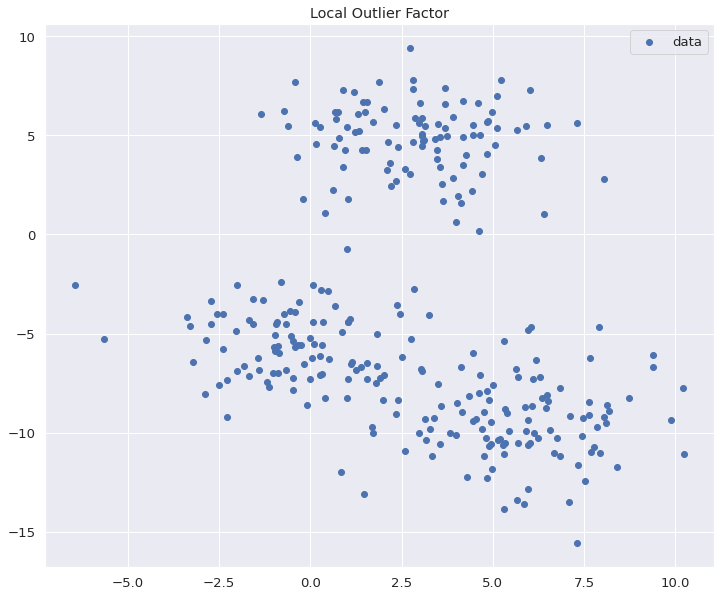

In [5]:
plt.figure(figsize=(12,10))
plt.scatter(data[:,0], data[:,1], label = 'data', cmap = 'tab10')
plt.title('Local Outlier Factor')
plt.legend()
plt.show()

In [6]:
from sklearn.neighbors import LocalOutlierFactor

lof = LocalOutlierFactor(n_neighbors = 20)
y_pred = lof.fit_predict(data)
y_pred[:10]

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1])

In [7]:
all_data = np.c_[data, y_pred]
all_data[:5]

array([[  4.64616033,   5.03253239,   1.        ],
       [  1.81963552,  -5.03357756,   1.        ],
       [  0.89059085,   3.41070216,   1.        ],
       [  0.61174827,   2.26068253,   1.        ],
       [  6.01229431, -10.52657552,   1.        ]])

In [8]:
tmp['y_pred'] = y_pred
px.scatter(tmp, x = 'x1', y = 'x2', color = 'y_pred', title = 'Local Outlier Factor', template='plotly_dark')

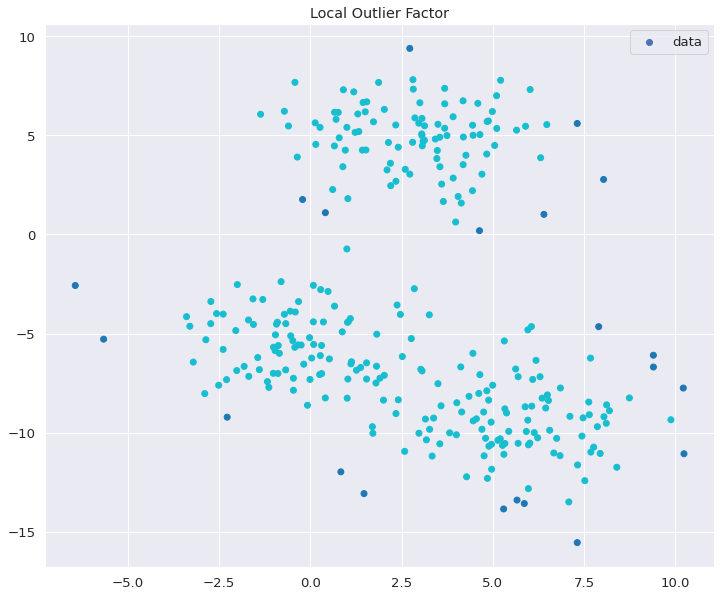

In [9]:
plt.figure(figsize=(12,10))
plt.scatter(data[:,0], data[:,1], c = y_pred, label = 'data', cmap = 'tab10')
plt.title('Local Outlier Factor')
plt.legend()
plt.show()

In [12]:
LOF_scores = lof.negative_outlier_factor_
radius = (LOF_scores.max() - LOF_scores)/(LOF_scores.max() - LOF_scores.min())
radius[:5]

array([0.03834082, 0.12830657, 0.1180624 , 0.24543848, 0.01556816])

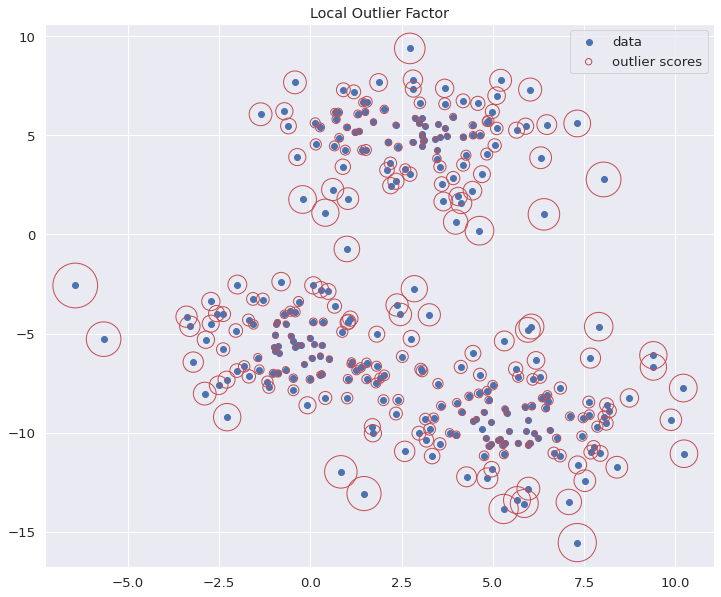

In [16]:
plt.figure(figsize=(12,10))
plt.scatter(data[:,0], data[:,1], label = 'data', cmap = 'tab10')
plt.scatter(data[:,0], data[:,1], s=2000*radius, edgecolors='r', facecolors = 'none', label = 'outlier scores')
plt.title('Local Outlier Factor')
legend = plt.legend()
legend.legendHandles[1]._sizes = [40]
plt.show()

## Isolation Forest - Las izolacyjny

### Zad 19

In [17]:
import numpy as np
import pandas as pd
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns

sns.set()

In [18]:
data = pd.read_csv('https://storage.googleapis.com/esmartdata-courses-files/ml-course/factory.csv')
data.head()

,item_length,item_width
0,6.206380,5.618286
1,5.756649,5.921924
2,5.576329,5.792401
3,5.304950,7.235000
4,6.764064,5.965792


In [19]:
data.describe()

,item_length,item_width
count,400.000000,400.000000
mean,5.824371,5.927004
std,1.040374,1.035379
min,0.117702,0.592448
25%,5.237362,5.410112
50%,5.907650,5.984139
75%,6.464539,6.513579
max,8.091519,8.365203


In [21]:
px.scatter(data, 'item_length', 'item_width', template='plotly_dark', width = 1000, title = 'Isolation Forest')

In [29]:
from sklearn.ensemble import IsolationForest

outlier = IsolationForest(n_estimators = 100, contamination=0.025) ## contamination (0, 0.05)
outlier.fit(data)

IsolationForest(behaviour='deprecated', bootstrap=False, contamination=0.025,
                max_features=1.0, max_samples='auto', n_estimators=100,
                n_jobs=None, random_state=None, verbose=0, warm_start=False)

In [30]:
y_pred = outlier.predict(data)
y_pred[:30]

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1])

In [31]:
data['outlier_flag'] = y_pred
px.scatter(data, x ='item_length', y = 'item_width', color = 'outlier_flag', width = 1000, template='plotly_dark',
           color_continuous_midpoint = -1, title = 'Isolation Forest')

## Anomalie w szeregach czasowych - Anomaly detection in time series

### Zad 20

In [34]:
!pip install fbprophet

In [32]:
import numpy as np
import pandas as pd
import plotly.express as px
import fbprophet

np.random.seed(41)
fbprophet.__version__

'0.7.1'

In [33]:
df = pd.read_csv('https://storage.googleapis.com/esmartdata-courses-files/ml-course/traffic.csv', 
                 parse_dates=['timestamp'])
df.head()


,timestamp,count
0,2018-09-25 14:01:00,182.478
1,2018-09-25 14:02:00,176.231
2,2018-09-25 14:03:00,183.917
3,2018-09-25 14:04:00,177.798
4,2018-09-25 14:05:00,165.469


In [35]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14398 entries, 0 to 14397
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   timestamp  14398 non-null  datetime64[ns]
 1   count      14398 non-null  float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 225.1 KB


In [36]:
px.line(df, x = 'timestamp', y = 'count', title = 'Anomaly Detection - web traffic', width = 1000, height=500,
        template = 'plotly_dark', color_discrete_sequence = ['#42f5d4'])

In [37]:
px.scatter(df, x = 'timestamp', y='count', title='Anomaly Detection - web traffic', width=1000, height=500,
           template = 'plotly_dark', color_discrete_sequence=['#42f5d4'])

In [38]:
df.head()

,timestamp,count
0,2018-09-25 14:01:00,182.478
1,2018-09-25 14:02:00,176.231
2,2018-09-25 14:03:00,183.917
3,2018-09-25 14:04:00,177.798
4,2018-09-25 14:05:00,165.469


In [39]:
data = df.copy()
data.columns = ['ds', 'y']
data.head()

,ds,y
0,2018-09-25 14:01:00,182.478
1,2018-09-25 14:02:00,176.231
2,2018-09-25 14:03:00,183.917
3,2018-09-25 14:04:00,177.798
4,2018-09-25 14:05:00,165.469


In [40]:
from fbprophet import Prophet

Prophet?

In [43]:
model = Prophet(daily_seasonality=True, yearly_seasonality=False, weekly_seasonality=False, interval_width=0.99, changepoint_range=0.8)
model.fit(data)
forecast = model.predict(data)

In [44]:
forecast.head()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,daily,daily_lower,daily_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2018-09-25 14:01:00,111.600106,132.797205,187.334256,111.600106,111.600106,48.864424,48.864424,48.864424,48.864424,48.864424,48.864424,0.0,0.0,0.0,160.464530
1,2018-09-25 14:02:00,111.601392,130.317007,191.563074,111.601392,111.601392,48.929051,48.929051,48.929051,48.929051,48.929051,48.929051,0.0,0.0,0.0,160.530443
2,2018-09-25 14:03:00,111.602678,135.528548,185.754231,111.602678,111.602678,48.990147,48.990147,48.990147,48.990147,48.990147,48.990147,0.0,0.0,0.0,160.592825
3,2018-09-25 14:04:00,111.603964,132.338786,192.261156,111.603964,111.603964,49.047686,49.047686,49.047686,49.047686,49.047686,49.047686,0.0,0.0,0.0,160.651650
4,2018-09-25 14:05:00,111.605250,133.412844,188.048425,111.605250,111.605250,49.101642,49.101642,49.101642,49.101642,49.101642,49.101642,0.0,0.0,0.0,160.706892


In [45]:
forecast[['ds', 'trend', 'yhat', 'yhat_lower', 'yhat_upper']].head(3)

,ds,trend,yhat,yhat_lower,yhat_upper
0,2018-09-25 14:01:00,111.600106,160.464530,132.797205,187.334256
1,2018-09-25 14:02:00,111.601392,160.530443,130.317007,191.563074
2,2018-09-25 14:03:00,111.602678,160.592825,135.528548,185.754231


In [46]:
forecast['real'] = data['y']
forecast['anomaly'] = 1
forecast.loc[forecast['real'] > forecast['yhat_upper'], 'anomaly'] = -1
forecast.loc[forecast['real'] < forecast['yhat_lower'], 'anomaly'] = -1
forecast.head(3)

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,daily,daily_lower,daily_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat,real,anomaly
0,2018-09-25 14:01:00,111.600106,132.797205,187.334256,111.600106,111.600106,48.864424,48.864424,48.864424,48.864424,48.864424,48.864424,0.0,0.0,0.0,160.464530,182.478,1
1,2018-09-25 14:02:00,111.601392,130.317007,191.563074,111.601392,111.601392,48.929051,48.929051,48.929051,48.929051,48.929051,48.929051,0.0,0.0,0.0,160.530443,176.231,1
2,2018-09-25 14:03:00,111.602678,135.528548,185.754231,111.602678,111.602678,48.990147,48.990147,48.990147,48.990147,48.990147,48.990147,0.0,0.0,0.0,160.592825,183.917,1


In [47]:
px.scatter(forecast, x = 'ds', y = 'real', color = 'anomaly', color_continuous_scale='Bluyl',
           title = 'Anomaly Detection in Time Series', template = 'plotly_dark', width = 1000, height = 500)

### Zad 21

In [48]:
future = model.make_future_dataframe(periods = 1440, freq = 'Min')
future

,ds
0,2018-09-25 14:01:00
1,2018-09-25 14:02:00
2,2018-09-25 14:03:00
3,2018-09-25 14:04:00
4,2018-09-25 14:05:00
...,...
15833,2018-10-06 13:54:00
15834,2018-10-06 13:55:00
15835,2018-10-06 13:56:00
15836,2018-10-06 13:57:00


In [49]:
forecast = model.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].head()

,ds,yhat,yhat_lower,yhat_upper
0,2018-09-25 14:01:00,160.464530,132.005475,187.508861
1,2018-09-25 14:02:00,160.530443,132.580905,186.040238
2,2018-09-25 14:03:00,160.592825,133.721454,188.303464
3,2018-09-25 14:04:00,160.651650,132.025466,192.797461
4,2018-09-25 14:05:00,160.706892,131.985145,188.613172


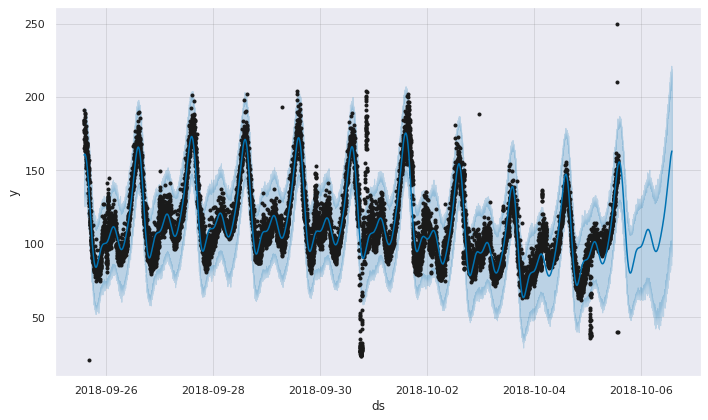

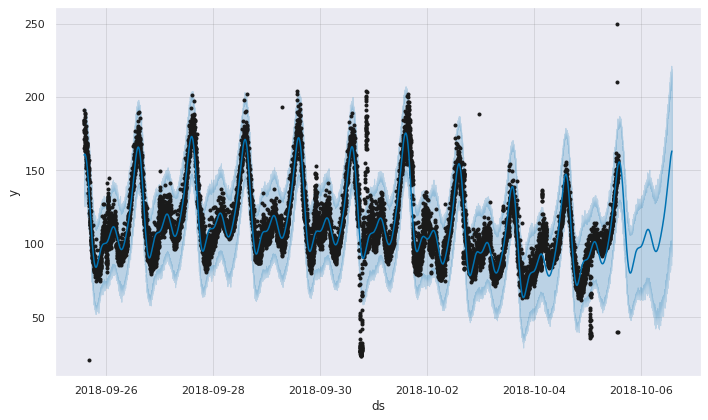

In [51]:
model.plot(forecast)

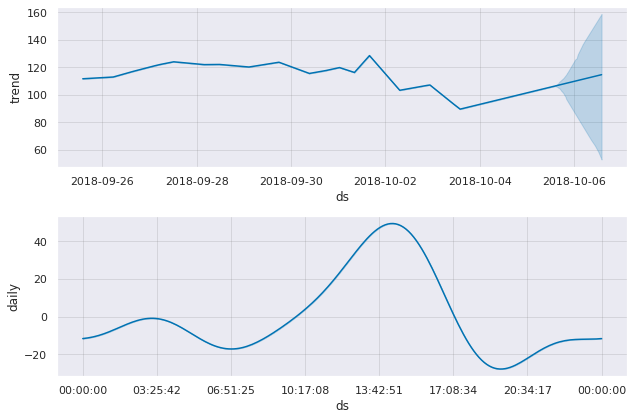

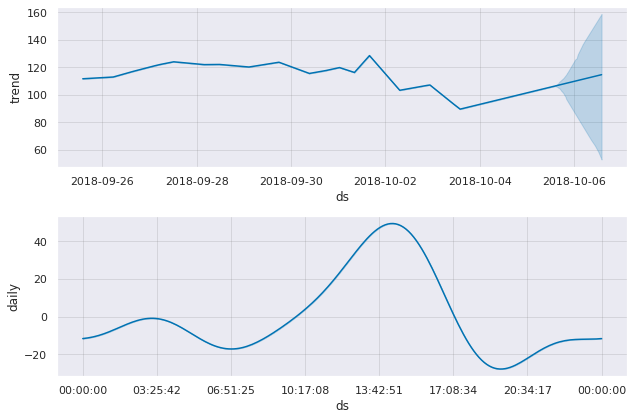

In [52]:
model.plot_components(forecast)

In [53]:
from fbprophet.plot import plot_plotly

plot_plotly(model, forecast, xlabel = 'czas', ylabel = 'ruch webowy')

In [54]:
data_sep = df[df.timestamp.dt.month == 9]
data_sep.columns = ['ds', 'y']
data_sep.head()

,ds,y
0,2018-09-25 14:01:00,182.478
1,2018-09-25 14:02:00,176.231
2,2018-09-25 14:03:00,183.917
3,2018-09-25 14:04:00,177.798
4,2018-09-25 14:05:00,165.469


In [55]:
model = Prophet(daily_seasonality=True, yearly_seasonality=False, weekly_seasonality=False, seasonality_mode='multiplicative', interval_width=0.99, changepoint_range=0.8)

model.fit(data_sep)
forecast = model.predict(data_sep)
forecast[['ds', 'trend', 'yhat', 'yhat_lower', 'yhat_upper']].head()

,ds,trend,yhat,yhat_lower,yhat_upper
0,2018-09-25 14:01:00,115.079545,165.368638,134.840936,194.662278
1,2018-09-25 14:02:00,115.063954,165.396413,134.614792,196.840781
2,2018-09-25 14:03:00,115.048362,165.420288,132.878676,193.111461
3,2018-09-25 14:04:00,115.032771,165.440238,135.594451,199.464976
4,2018-09-25 14:05:00,115.017179,165.456244,134.737325,199.440368


In [56]:
forecast['real'] = data['y']
forecast['anomaly'] = 1
forecast.loc[forecast['real'] > forecast['yhat_upper'], 'anomaly'] = -1
forecast.loc[forecast['real'] < forecast['yhat_lower'], 'anomaly'] = -1
forecast.head(3)

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,daily,daily_lower,daily_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,additive_terms,additive_terms_lower,additive_terms_upper,yhat,real,anomaly
0,2018-09-25 14:01:00,115.079545,134.840936,194.662278,115.079545,115.079545,0.436994,0.436994,0.436994,0.436994,0.436994,0.436994,0.0,0.0,0.0,165.368638,182.478,1
1,2018-09-25 14:02:00,115.063954,134.614792,196.840781,115.063954,115.063954,0.437430,0.437430,0.437430,0.437430,0.437430,0.437430,0.0,0.0,0.0,165.396413,176.231,1
2,2018-09-25 14:03:00,115.048362,132.878676,193.111461,115.048362,115.048362,0.437833,0.437833,0.437833,0.437833,0.437833,0.437833,0.0,0.0,0.0,165.420288,183.917,1


In [57]:
px.scatter(forecast, x = 'ds', y = 'real', color = 'anomaly', color_continuous_scale='Bluyl',
           title = 'Anomaly Detection in September', template = 'plotly_dark', width = 1000, height = 500)

In [58]:
future = model.make_future_dataframe(periods=1440, freq = 'Min')
future

,ds
0,2018-09-25 14:01:00
1,2018-09-25 14:02:00
2,2018-09-25 14:03:00
3,2018-09-25 14:04:00
4,2018-09-25 14:05:00
...,...
9234,2018-10-01 23:55:00
9235,2018-10-01 23:56:00
9236,2018-10-01 23:57:00
9237,2018-10-01 23:58:00


In [59]:
forecast = model.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].head()

,ds,yhat,yhat_lower,yhat_upper
0,2018-09-25 14:01:00,165.368638,134.414700,195.606269
1,2018-09-25 14:02:00,165.396413,137.544314,195.800832
2,2018-09-25 14:03:00,165.420288,135.034525,196.198341
3,2018-09-25 14:04:00,165.440238,134.696961,196.393530
4,2018-09-25 14:05:00,165.456244,137.013947,196.085547


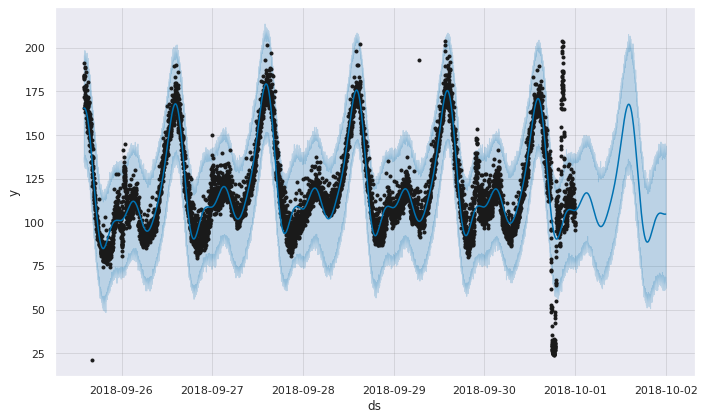

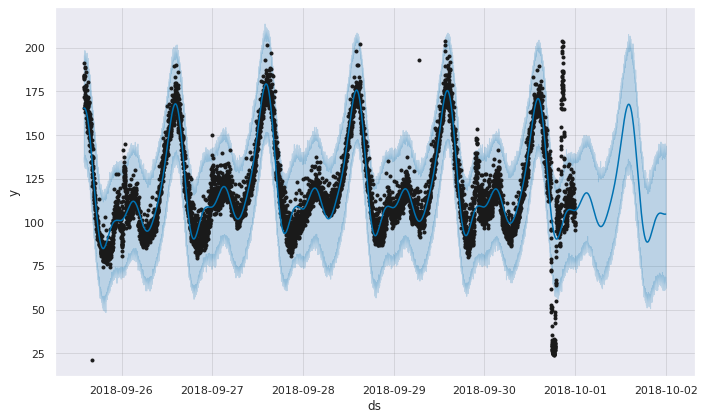

In [61]:
model.plot(forecast)

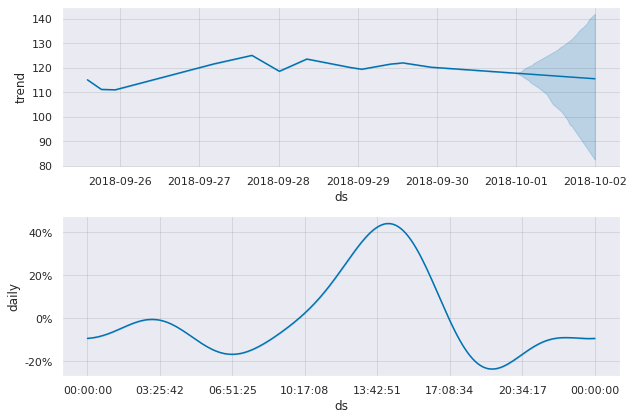

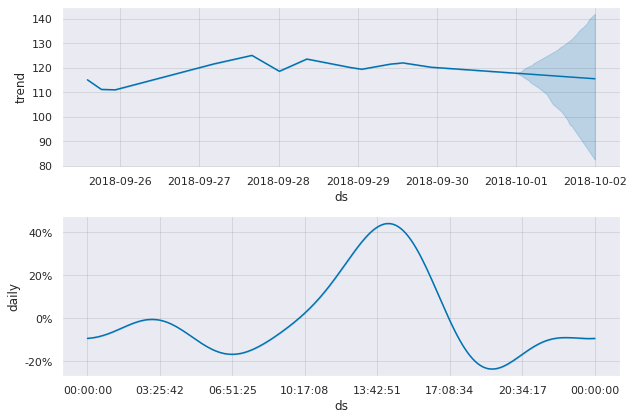

In [62]:
model.plot_components(forecast)

In [63]:
from fbprophet.plot import plot_plotly

plot_plotly(model, forecast, xlabel = 'czas', ylabel = 'ruch webowy')